In [1]:
# JWST Image Processing Tutorial
# ============================
#
# This notebook demonstrates how to process raw James Webb Space Telescope (JWST) images into beautiful,
# colorized composite images that you can use in your own projects or just admire.

import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
from skimage import exposure, color
from skimage.io import imread, imsave
from skimage.util import img_as_ubyte
from dataclasses import dataclass, fields
from PIL import Image
from IPython.display import display
from typing import Dict, List, Tuple, Any
import warnings

# Suppress warnings that might clutter our output
warnings.simplefilter("ignore")

# Increase max image size for PIL to handle large JWST images
Image.MAX_IMAGE_PIXELS = None

# Display settings for better visualization
plt.rcParams['figure.figsize'] = (12, 10)

In [2]:
# Cell 1: Define the metadata structures
# =====================================

@dataclass()
class WebbFilter:
    """Stores information about a filter on JWST and its transmission characteristics."""
    name: str
    instrument: str
    wavelength: float
    bandwidth: float
    is_pupil: bool = False

    def get_filter_name(self):
        """Returns a filter name in the format `INSTRUMENT-FILTER`."""
        return self.instrument + "-" + self.name


class MetadataContainer:
    """Container for filter information that can be accessed as list or dictionary."""
    def __init__(self, dataclass_list: list):
        self.list = dataclass_list
        self.dict = {getattr(obj, fields(obj)[0].name): obj for obj in dataclass_list}


# Define JWST filter information
class WebbFilters:
    """Stores information about the filters on NIRCAM and MIRI."""
    FILTERS = {
        # NIRCAM filters data
        "NIRCAM": MetadataContainer(
            [
                WebbFilter("F070W", "NIRCAM", 0.704, 0.128, False),
                WebbFilter("F090W", "NIRCAM", 0.901, 0.194, False),
                WebbFilter("F115W", "NIRCAM", 1.154, 0.225, False),
                WebbFilter("F140M", "NIRCAM", 1.404, 0.142, False),
                WebbFilter("F150W", "NIRCAM", 1.501, 0.318, False),
                WebbFilter("F162M", "NIRCAM", 1.626, 0.168, True),
                WebbFilter("F164N", "NIRCAM", 1.644, 0.020, True),
                WebbFilter("F150W2", "NIRCAM", 1.671, 1.227, False),
                WebbFilter("F182M", "NIRCAM", 1.845, 0.238, False),
                WebbFilter("F187N", "NIRCAM", 1.874, 0.024, False),
                WebbFilter("F200W", "NIRCAM", 1.990, 0.461, False),
                WebbFilter("F210M", "NIRCAM", 2.093, 0.205, False),
                WebbFilter("F212N", "NIRCAM", 2.120, 0.027, False),
                WebbFilter("F250M", "NIRCAM", 2.503, 0.181, False),
                WebbFilter("F277W", "NIRCAM", 2.786, 0.672, False),
                WebbFilter("F300M", "NIRCAM", 2.996, 0.318, False),
                WebbFilter("F322W2", "NIRCAM", 3.247, 1.339, False),
                WebbFilter("F323N", "NIRCAM", 3.237, 0.038, True),
                WebbFilter("F335M", "NIRCAM", 3.365, 0.347, False),
                WebbFilter("F356W", "NIRCAM", 3.563, 0.787, False),
                WebbFilter("F360M", "NIRCAM", 3.621, 0.372, False),
                WebbFilter("F405N", "NIRCAM", 4.055, 0.046, True),
                WebbFilter("F410M", "NIRCAM", 4.092, 0.436, False),
                WebbFilter("F430M", "NIRCAM", 4.280, 0.228, False),
                WebbFilter("F444W", "NIRCAM", 4.421, 1.024, False),
                WebbFilter("F460M", "NIRCAM", 4.624, 0.228, False),
                WebbFilter("F466N", "NIRCAM", 4.654, 0.054, True),
                WebbFilter("F470N", "NIRCAM", 4.707, 0.051, True),
                WebbFilter("F480M", "NIRCAM", 4.834, 0.303, False),
            ]
        ),
        # MIRI filters data
        "MIRI": MetadataContainer(
            [
                WebbFilter("F560W", "MIRI", 5.6, 1.2),
                WebbFilter("F770W", "MIRI", 7.7, 2.2),
                WebbFilter("F1000W", "MIRI", 10.0, 2.0),
                WebbFilter("F1130W", "MIRI", 11.3, 0.7),
                WebbFilter("F1280W", "MIRI", 12.8, 2.4),
                WebbFilter("F1500W", "MIRI", 15.0, 3.0),
                WebbFilter("F1800W", "MIRI", 18.0, 3.0),
                WebbFilter("F2100W", "MIRI", 21.0, 5.0),
                WebbFilter("F2550W", "MIRI", 25.5, 4.0),
                WebbFilter("F2550WR", "MIRI", 25.5, 4.0),
                WebbFilter("FND", "MIRI", 13, 10),
            ]
        ),
    }

print("Metadata structures defined successfully!")

Metadata structures defined successfully!


In [11]:
# Cell 2: Define the FITS processing class
# =======================================

class WebbsterFITS:
    """Processes FITS files from JWST and helps perform image operations."""

    def __init__(self, filepath: str):
        """
        Opens the file at `filepath`, gets data from FITS HDUList object, and
        uses it to populate fields.
        """
        self.filepath = filepath
        self.hdul = fits.open(self.filepath)
        self.fits_filename = self.hdul[0].header["FILENAME"].upper()
        self.hdu = self.hdul[1]
        self.naxis1 = self.hdu.header["NAXIS1"]
        self.naxis2 = self.hdu.header["NAXIS2"]
        self.res = self.naxis1 * self.naxis2
        self.data = self.hdu.data
        self.filter = self.get_filter()
        self.name = self.filter.get_filter_name() if self.filter else "NONE"
        
        # Display basic information about the image
        print(f"Loaded: {os.path.basename(filepath)}")
        print(f"Filter: {self.name}")
        print(f"Size: {self.naxis1} x {self.naxis2} pixels")
        print(f"Resolution: {self.res} pixels")

    def get_filter(self) -> WebbFilter:
        """
        Gets filter by searching for an instance of a filter name in fits
        filename. If there are multiple instances, prefers the one that is on
        the pupil wheel, or appears last.
        """
        # Get instrument and filter names from fits filename
        try:
            name_parts = self.fits_filename.split("_")
            instrument = name_parts[2]
            filters = name_parts[3].split("-")
        except:
            return None

        # Get dictionary of filters for the specific instrument
        if instrument not in WebbFilters.FILTERS:
            return None
        instrument_filters = WebbFilters.FILTERS[instrument].dict

        # Find appropriate filter
        fits_filter = None
        for filter in reversed(filters):
            if filter in instrument_filters and (
                fits_filter is None or instrument_filters[filter].is_pupil
            ):
                fits_filter = instrument_filters[filter]

        return fits_filter

    def display_raw_data(self):
        """Display the raw data with appropriate scaling."""
        # Get min and max for display
        vmin, vmax = np.percentile(self.data, (1, 99.5))
        
        plt.figure()
        plt.imshow(self.data, cmap='gray', vmin=vmin, vmax=vmax, origin='lower')
        plt.colorbar(label='Raw intensity values')
        plt.title(f"Raw FITS data for {self.name}")
        plt.show()

    def adjust_contrast(self):
        """
        Stretches out the darker portions of the image for better visibility.
        Handles NaN values that might be present in the FITS data.
        """
        # Handle NaN values by replacing them with zeros
        if np.isnan(self.data).any():
            print("Warning: NaN values detected in the data. Replacing with zeros.")
            self.data = np.nan_to_num(self.data, nan=0.0)
        
        # Display original histogram
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.hist(self.data.flatten(), bins=100)
        plt.title("Original intensity distribution")
        plt.yscale('log')
        
        # Rescale intensity (clip darkest and brightest areas)
        lo, hi = np.percentile(self.data, (15, 99.85))
        print(f"Stretching contrast: clipping values below {lo:.6f} and above {hi:.6f}")
        self.data = exposure.rescale_intensity(self.data, in_range=(lo, hi))
        self.data = np.clip(self.data, 0.0, 1.0)
        
        # Display mid-processing histogram
        plt.subplot(1, 3, 2)
        plt.hist(self.data.flatten(), bins=100)
        plt.title("After linear stretching")
        plt.yscale('log')
        
        # Adaptive histogram equalization
        print("Applying adaptive histogram equalization...")
        self.data = exposure.equalize_adapthist(self.data, clip_limit=0.02)
        
        # Display final histogram
        plt.subplot(1, 3, 3)
        plt.hist(self.data.flatten(), bins=100)
        plt.title("After histogram equalization")
        plt.yscale('log')
        plt.tight_layout()
        plt.show()
        
        # Display the adjusted image
        plt.figure()
        plt.imshow(self.data, cmap='gray', origin='lower')
        plt.colorbar(label='Adjusted intensity values')
        plt.title(f"Contrast-adjusted image for {self.name}")
        plt.show()

    def reproject(self, ref_fits: "WebbsterFITS", max_pixels: int = 50_000_000):
        """
        Reprojects image to be aligned with `ref_fits` using WCS data.
        To save on memory, the image is processed in slices.
        """
        print(f"Reprojecting {self.name} to match {ref_fits.name}...")
        print(f"This may take a while for large images...")
        
        start_row = 0
        max_rows = max_pixels // ref_fits.naxis1
        # Empty array to which slices will be concatenated
        proj_data = np.empty((0, ref_fits.naxis1), dtype=np.uint8)
        
        while start_row < ref_fits.naxis2:
            if ref_fits.naxis2 - start_row > max_rows:
                end_row = start_row + max_rows
            else:
                end_row = ref_fits.naxis2
                
            print(f"Processing rows {start_row} to {end_row}...")
            
            # Slice the WCS of the reference image
            ref_wcs = WCS(ref_fits.hdu.header)
            ref_wcs = ref_wcs[start_row:end_row, 0 : ref_fits.naxis1]
            slice_shape = (end_row - start_row, ref_fits.naxis1)
            
            # Reproject, and convert to uint8 to save memory
            proj_slice = img_as_ubyte(
                reproject_interp(
                    (self.data, self.hdu.header), ref_wcs, shape_out=slice_shape
                )[0]
            )
            
            # Concatenate new slice onto the end of our image
            proj_data = np.concatenate((proj_data, proj_slice))
            start_row = end_row
            
        # Set data to reprojected data
        self.data = proj_data
        print(f"Reprojection of {self.name} complete!")
        
        # Display the reprojected image
        plt.figure()
        plt.imshow(self.data, cmap='gray', origin='lower')
        plt.title(f"Reprojected image for {self.name}")
        plt.show()

    def save_image(
        self, folder: str = None, filename: str = None, extension: str = "png"
    ) -> str:
        """
        Converts data to uint8 and optionally saves as image.
        """
        self.png_data = img_as_ubyte(self.data)
        self.png_data = np.flipud(self.png_data)
        
        if folder:
            os.makedirs(folder, exist_ok=True)
            filepath = os.path.join(
                folder,
                filename
                or f"{self.fits_filename.split('-')[0]}_{self.name}.{extension}",
            )
            print(f"Saving layer image to {filepath}")
            imsave(filepath, self.png_data)
            return filepath
        
        return None

In [4]:
# Cell 3: Define the Layer Processing Class
# ========================================

class WebbsterLayer:
    """Helps colorize a grayscale layer and process image data."""

    @staticmethod
    def fromImageFile(
        image_file: str,
        hue: float = None,
        saturation: float = None,
        value: float = None,
        filter: WebbFilter = None,
    ) -> "WebbsterLayer":
        """Creates WebbsterLayer from an image file."""
        # If no filter is provided, look for filter name in the filename
        if not filter:
            try:
                instrument, filter_name = (
                    os.path.basename(image_file).upper().split(".")[0].split("_")[1].split("-")
                )
            except:
                instrument = None
                filter_name = None

            if (
                instrument
                and filter_name
                and instrument in WebbFilters.FILTERS
                and filter_name in WebbFilters.FILTERS[instrument].dict
            ):
                filter = WebbFilters.FILTERS[instrument].dict[filter_name]

        hue, saturation, value = WebbsterLayer.get_hsv(
            hue, saturation, value, filter, strict=True
        )
        return WebbsterLayer(
            imread(image_file), os.path.basename(image_file), hue, saturation, value, image_file
        )

    @staticmethod
    def fromFITS(
        fits: WebbsterFITS,
        hue: float = None,
        saturation: float = None,
        value: float = None,
        filter: WebbFilter = None,
    ) -> "WebbsterLayer":
        """Creates WebbsterLayer from a WebbsterFITS."""
        hue, saturation, value = WebbsterLayer.get_hsv(
            hue,
            saturation,
            value,
            filter or fits.filter,
        )
        return WebbsterLayer(fits.png_data, fits.name, hue, saturation, value)

    def __init__(
        self,
        image: Any,
        name: str,
        hue: float,
        saturation: float,
        value: float,
        filepath: str = None,
    ):
        """Creates WebbsterLayer from the given image data, name, and HSV."""
        self.gray_image = image
        self.name = name
        self.hue = hue
        self.saturation = saturation
        self.value = value
        if filepath:
            self.filepath = filepath
        
        print(f"Created layer: {name}")
        print(f"HSV values: H={hue*360:.1f}°, S={saturation*100:.1f}%, V={value*100:.1f}%")
        
        # Display a small preview of the grayscale image
        plt.figure(figsize=(5, 5))
        plt.imshow(self.gray_image, cmap='gray')
        plt.title(f"Grayscale preview: {name}")
        plt.show()

    def colorize(self):
        """
        Colorize the grayscale image and set color_image to new RGB image.
        """
        print(f"Colorizing {self.name} with HSV: ({self.hue*360:.1f}°, {self.saturation*100:.1f}%, {self.value*100:.1f}%)")
        
        rgb = color.gray2rgb(self.gray_image)
        multiplier = np.array(
            [self.hue, self.saturation, self.value],
            dtype=np.float64,
        )
        multiplier = color.hsv2rgb(multiplier)
        self.color_image = (rgb * multiplier).astype(np.uint8)
        
        # Display the colorized image
        plt.figure(figsize=(8, 8))
        plt.imshow(self.color_image)
        plt.title(f"Colorized image: {self.name}")
        plt.show()
        
        return self.color_image

    @staticmethod
    def get_hsv(
        hue: float = None,
        saturation: float = None,
        value: float = None,
        filter: WebbFilter = None,
        strict: bool = False,
    ) -> Tuple[float, float, float]:
        """Returns a tuple of (hue, saturation, value) based on the input."""
        new_hue = new_saturation = None

        if filter:
            new_hue, new_saturation = WebbsterLayer.get_filter_hue_saturation(filter)
        if hue is None:
            hue = new_hue
        if saturation is None:
            saturation = new_saturation

        if (hue is None or saturation is None) and strict:
            raise ValueError(
                "Must at least provide either filter or hue and saturation."
            )

        return (hue, saturation, 1 if value is None else value)

    @staticmethod
    def get_filter_hue_saturation(filter: WebbFilter) -> Tuple[float, float]:
        """
        Gets representative hue and saturation for a filter based on the
        filter's pivot wavelength and bandwidth.
        """
        # If there is no filter, this layer will be grayscale
        if not filter:
            return (0, 0)

        # Each filter is given a hue based on where its wavelength falls in
        # relation to the entire range of the filter's instrument, and a
        # saturation based on its bandwidth.
        instrument_filters = WebbFilters.FILTERS[filter.instrument].list
        all_bandwidths = [filter.bandwidth for filter in instrument_filters]
        bw_range = (min(all_bandwidths), max(all_bandwidths))
        all_wavelengths = [filter.wavelength for filter in instrument_filters]
        wl_range = (min(all_wavelengths), max(all_wavelengths))

        hue_range = (0, 240 / 360)
        saturation_range = (0, 1)

        # Get the proportion of the wavelength on the wavelength range
        wl_prop = (filter.wavelength - wl_range[0]) / (wl_range[1] - wl_range[0])
        # Adjust the proportion according to an S-curve to avoid too much green
        wl_prop_adj = wl_prop
        try:
            wl_prop_adj = 1 / (1 + (wl_prop / (1 - wl_prop)) ** -2)
        except:
            wl_prop_adj = round(wl_prop)
        # Convert adjusted proportion to hue (inverted because wavelength is inversely proportional to hue)
        hue = hue_range[1] - wl_prop_adj * (hue_range[1] - hue_range[0])

        # Get the proportion of the bandwidth on the bandwidth range
        bw_prop = (filter.bandwidth - bw_range[0]) / (bw_range[1] - bw_range[0])
        saturation = saturation_range[1] - bw_prop * (
            saturation_range[1] - saturation_range[0]
        )

        return (hue, saturation)

In [5]:
# Cell 4: Define the Blending Functions
# ====================================

def screen_blend(image1: Any, image2: Any):
    """
    Screen blend two RGB uint8 images.
    Similar to how light combines when projected through film.
    """
    return 255 - np.floor_divide(
        (255 - image1).astype(np.uint) * (255 - image2).astype(np.uint), 255
    ).astype(np.uint8)


def screen_blend_multiple(images: List[np.ndarray], brightness: float = None):
    """
    Blends multiple images using screen blending.
    Decreases the brightness of each image based on the number of layers.
    """
    if not images:
        return None
        
    # When there are more layers, we reduce brightness to compensate
    brightness = 1 - 0.05 * len(images) if brightness is None else brightness
    print(f"Blending {len(images)} images with brightness factor of {brightness:.2f}")

    # Start with the first image
    blended = images[0].copy()
    
    # Display the first image
    plt.figure(figsize=(8, 8))
    plt.imshow(blended)
    plt.title(f"Starting with first layer")
    plt.show()
    
    # Blend each subsequent image
    for i in range(1, len(images)):
        multiplier = np.array([brightness, brightness, brightness], dtype=np.float64)
        new_image = (images[i] * multiplier).astype(np.uint8)
        
        # Show the layer being added
        plt.figure(figsize=(15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(blended)
        plt.title("Current blend")
        
        plt.subplot(1, 3, 2)
        plt.imshow(new_image)
        plt.title(f"Adding layer {i+1}")
        
        # Blend images
        blended = screen_blend(blended, new_image)
        
        plt.subplot(1, 3, 3)
        plt.imshow(blended)
        plt.title("Result after blending")
        plt.tight_layout()
        plt.show()
    
    return blended

In [6]:
# Cell 5: Define a function to parse colors file
# ============================================

def parse_colors_file(colors_filepath: str) -> Dict[str, Tuple[float, float, float]]:
    """
    Parses a colors file and returns a dictionary with filepaths as keys and HSV tuples as values.
    
    Format for each line: "FILEPATH" (HUE, SATURATION, VALUE)
    
    HUE, SATURATION, and VALUE can each be a single number or a range (e.g. 75-100).
    Ranges for HSV are [0-360], [0-100], and [0-100], respectively.
    """
    import random
    
    print(f"Parsing colors file: {colors_filepath}")
    with open(colors_filepath, "r") as f:
        lines = f.readlines()

    image_colors = {}
    for line in lines:
        # Filename is after the first quote, before the second
        parts = line.strip().split('"')
        filename = parts[1]
        # Get HSV strings from inside parentheses
        hsv_strings = [c.strip() for c in parts[2].strip()[1:-1].split(",")]
        hsv = []
        # Parse each component - if it's a range, generate a random value
        for component in hsv_strings:
            if "-" in component:
                lo, hi = (int(x.strip()) for x in component.split("-"))
                hsv.append(random.randint(lo, hi))
            else:
                hsv.append(int(component))
                
        # Convert from HSV ranges to [0-1] scale
        image_colors[os.path.abspath(filename).upper()] = (
            hsv[0] / 360,
            hsv[1] / 100,
            hsv[2] / 100,
        )
        print(f"  {os.path.basename(filename)}: HSV=({hsv[0]}°, {hsv[1]}%, {hsv[2]}%)")

    return image_colors

In [7]:
# Cell 6: Define the FITS to Image Pipeline
# =======================================

def process_fits_folder(
    fits_folder: str, 
    output_image: str, 
    layers_folder: str = None,
    layers_extension: str = "png"
):
    """
    Process a folder of FITS files into a single composite image.
    Optionally save the individual layer images.
    """
    # Get a list of all FITS files in the folder
    fits_files = [
        os.path.join(fits_folder, filename)
        for filename in os.listdir(fits_folder)
        if filename.endswith(".fits")
    ]
    
    if not fits_files:
        print(f"No FITS files found in {fits_folder}")
        return
    
    print(f"Found {len(fits_files)} FITS files to process")
    
    # Load each FITS file
    filters = []
    for fits_file in fits_files:
        filters.append(WebbsterFITS(fits_file))
    
    # Find the reference filter with highest resolution
    max_res = 0
    ref_filter = filters[0]
    names = {}
    for filter in filters:
        if filter.res > max_res:
            max_res = filter.res
            ref_filter = filter

        # Handle duplicate filter names
        if filter.name in names:
            names[filter.name] += 1
            filter.name = filter.name + "-" + str(names[filter.name])
        else:
            names[filter.name] = 1

    print(f"Reference filter is {ref_filter.name} with resolution {ref_filter.res} pixels")
    
    # Process each filter
    for filter in filters:
        print(f"\nProcessing {filter.name}...")
        
        # Show the raw data
        filter.display_raw_data()
        
        # Adjust the contrast
        filter.adjust_contrast()
        
        # Reproject if this isn't the reference filter
        if filter != ref_filter:
            filter.reproject(ref_filter)
            
        # Save the layer image if requested
        if layers_folder:
            filter.save_image(layers_folder, extension=layers_extension)
    
    # Convert to layers and colorize
    layers = []
    for filter in filters:
        print(f"\nCreating colorized layer for {filter.name}...")
        layer = WebbsterLayer.fromFITS(filter)
        layer.colorize()
        layers.append(layer)
    
    # Blend the layers
    print("\nBlending all layers together...")
    blended_image = screen_blend_multiple([layer.color_image for layer in layers])
    
    # Display the final image
    plt.figure(figsize=(12, 12))
    plt.imshow(blended_image)
    plt.title("Final composite image")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Save the final image
    os.makedirs(os.path.dirname(output_image) or '.', exist_ok=True)
    imsave(output_image, blended_image)
    print(f"\nSaved final composite image to {output_image}")
    
    return blended_image

In [8]:
# Cell 7: Define the Layer Combining Pipeline
# =========================================

def combine_layers(
    layers_folder: str,
    output_image: str,
    colors_file: str = None,
    export_colors_file: str = None
):
    """
    Combine preprocessed layer images into a single color image.
    Optionally use custom colors from a colors file.
    """
    # Get all image files in the folder
    image_files = [
        os.path.join(layers_folder, filename)
        for filename in os.listdir(layers_folder)
        if filename.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
    
    if not image_files:
        print(f"No image files found in {layers_folder}")
        return
    
    print(f"Found {len(image_files)} image files to process")
    
    # If a colors file is provided, use the specified colors
    custom_colors = {}
    if colors_file:
        custom_colors = parse_colors_file(colors_file)
    
    # Create layers from each image file
    layers = []
    colors_used = []
    
    for image_file in image_files:
        abs_path = os.path.abspath(image_file).upper()
        
        # If we have custom colors for this file, use them
        if colors_file and abs_path in custom_colors:
            hsv = custom_colors[abs_path]
            print(f"Using custom colors for {os.path.basename(image_file)}: HSV=({hsv[0]*360:.1f}°, {hsv[1]*100:.1f}%, {hsv[2]*100:.1f}%)")
            layer = WebbsterLayer.fromImageFile(image_file, *hsv)
        else:
            # Otherwise try to determine colors from filename
            layer = WebbsterLayer.fromImageFile(image_file)
        
        # Store the colors used for potential export
        hsv = [
            round(layer.hue * 360),
            round(layer.saturation * 100),
            round(layer.value * 100),
        ]
        colors_used.append(f'"{image_file}" ({hsv[0]}, {hsv[1]}, {hsv[2]})')
        
        # Colorize the layer
        layer.colorize()
        layers.append(layer)
    
    # Export the colors if requested
    if export_colors_file:
        print(f"Exporting colors to {export_colors_file}")
        with open(export_colors_file, "w") as f:
            f.write("\n".join(colors_used))
    
    # Blend the layers

Found 5 FITS files to process
Loaded: jw02731-o001_t017_nircam_clear-f200w_i2d.fits
Filter: NIRCAM-F200W
Size: 14342 x 8588 pixels
Resolution: 123169096 pixels
Loaded: jw02731-o001_t017_nircam_clear-f187n_i2d.fits
Filter: NIRCAM-F187N
Size: 14340 x 8583 pixels
Resolution: 123080220 pixels
Loaded: jw02731-o001_t017_nircam_clear-f335m_i2d.fits
Filter: NIRCAM-F335M
Size: 7065 x 4178 pixels
Resolution: 29517570 pixels
Loaded: jw02731-o001_t017_nircam_clear-f090w_i2d.fits
Filter: NIRCAM-F090W
Size: 14338 x 8581 pixels
Resolution: 123034378 pixels
Loaded: jw02731-o001_t017_nircam_f444w-f470n_i2d.fits
Filter: NIRCAM-F470N
Size: 7058 x 4179 pixels
Resolution: 29495382 pixels
Reference filter is NIRCAM-F200W with resolution 123169096 pixels

Processing NIRCAM-F200W...


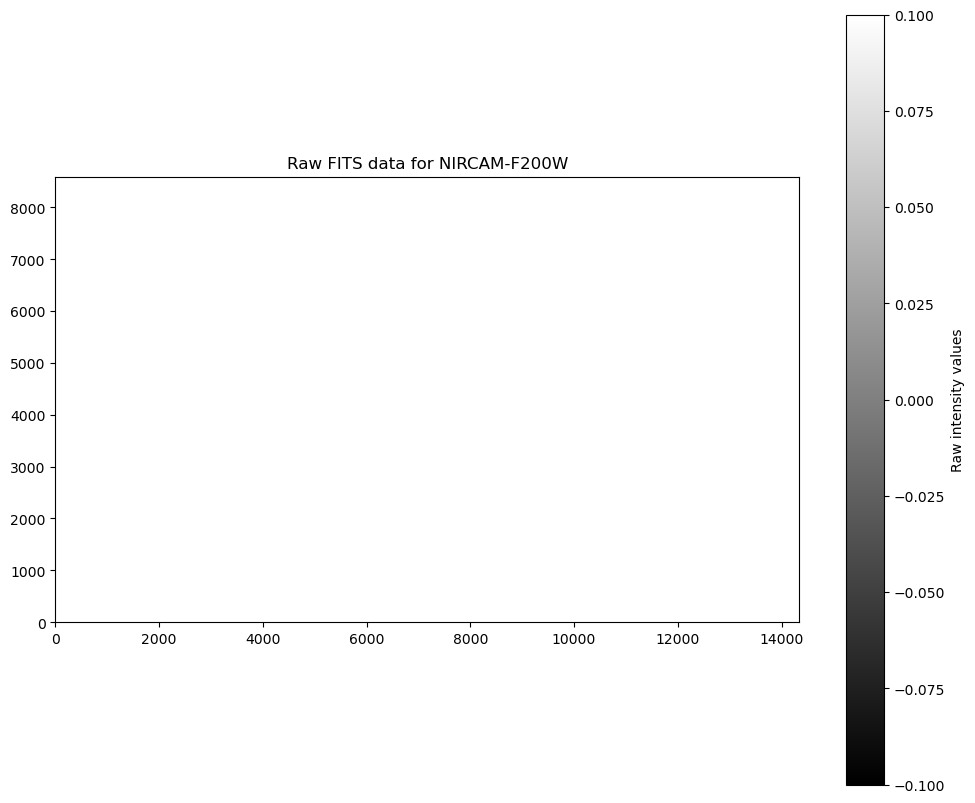

Stretching contrast: clipping values below 1.248675 and above 68.381711
Applying adaptive histogram equalization...


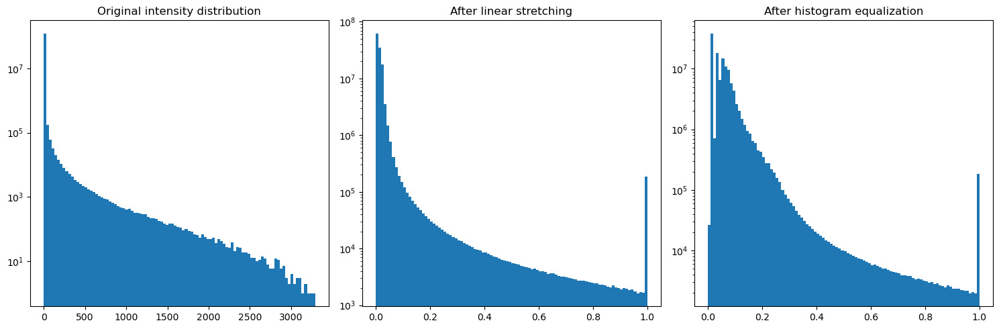

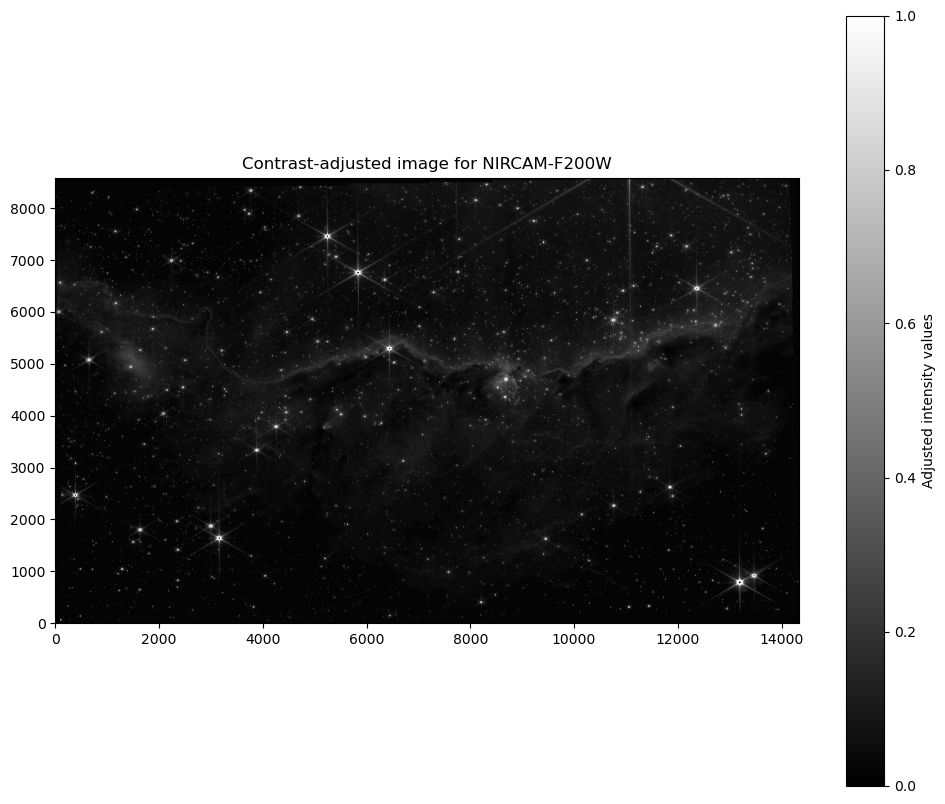

Saving layer image to layers/JW02731_NIRCAM-F200W.png

Processing NIRCAM-F187N...


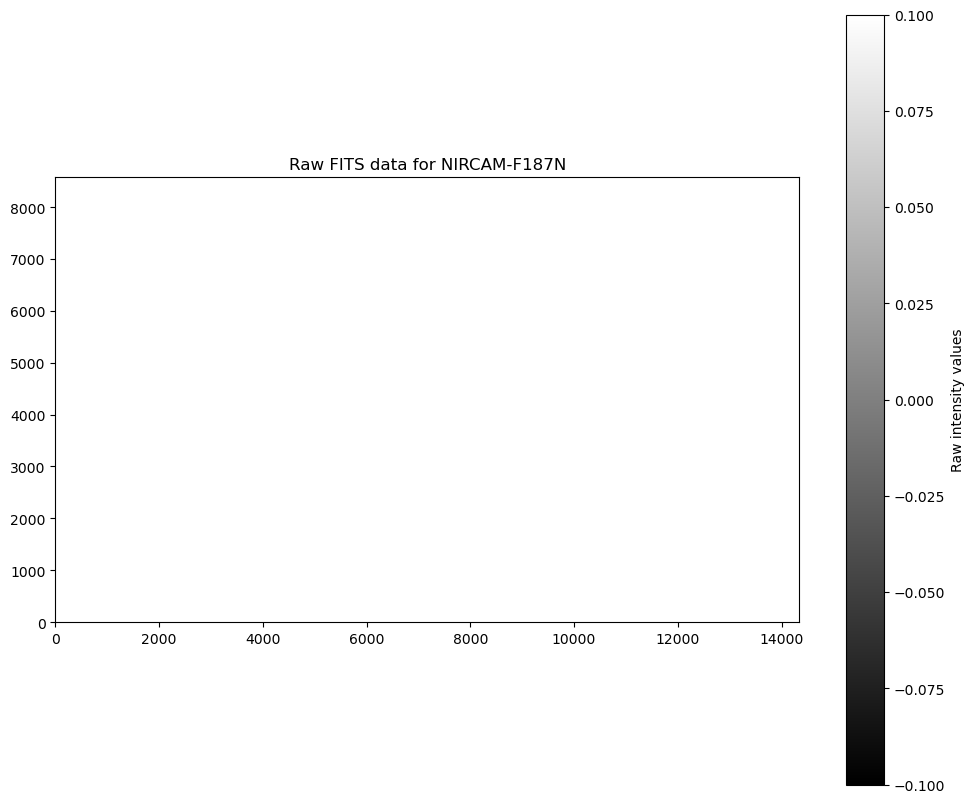

Stretching contrast: clipping values below 5.523723 and above 85.766660
Applying adaptive histogram equalization...


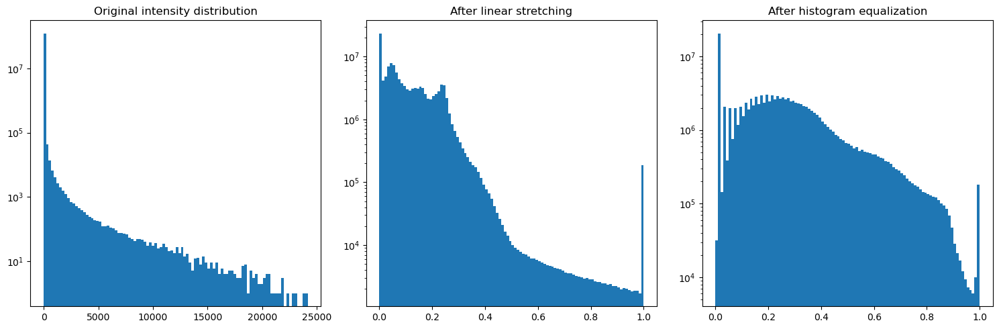

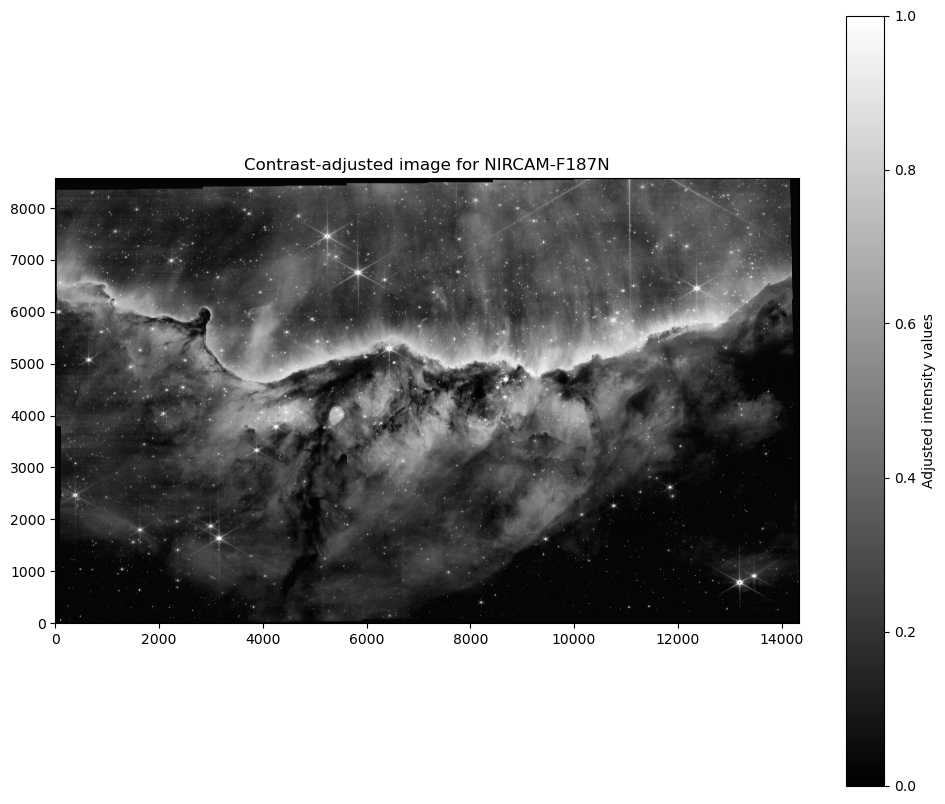

Reprojecting NIRCAM-F187N to match NIRCAM-F200W...
This may take a while for large images...
Processing rows 0 to 3486...
Processing rows 3486 to 6972...
Processing rows 6972 to 8588...
Reprojection of NIRCAM-F187N complete!


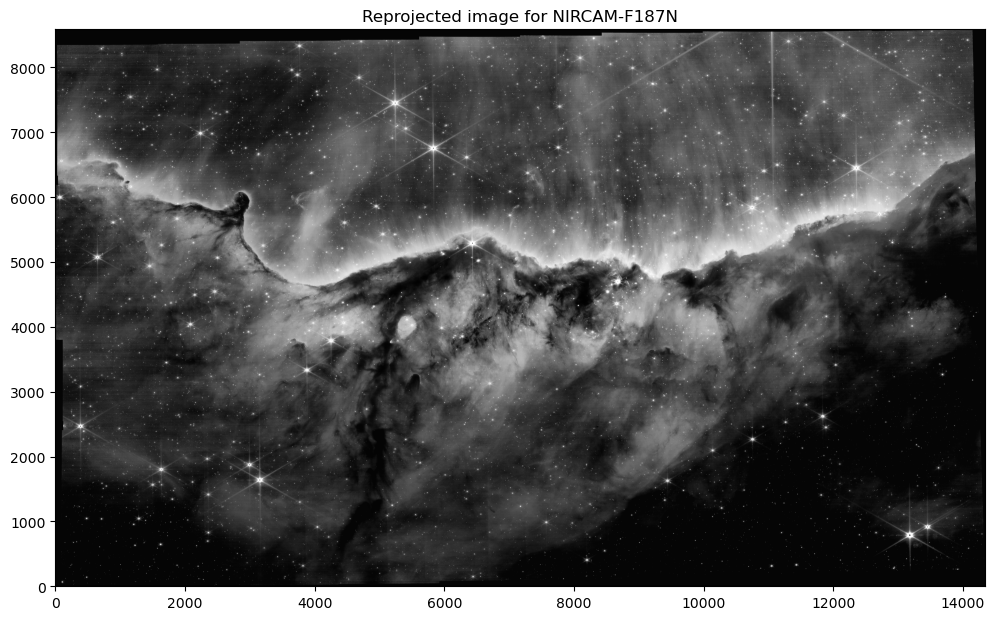

Saving layer image to layers/JW02731_NIRCAM-F187N.png

Processing NIRCAM-F335M...


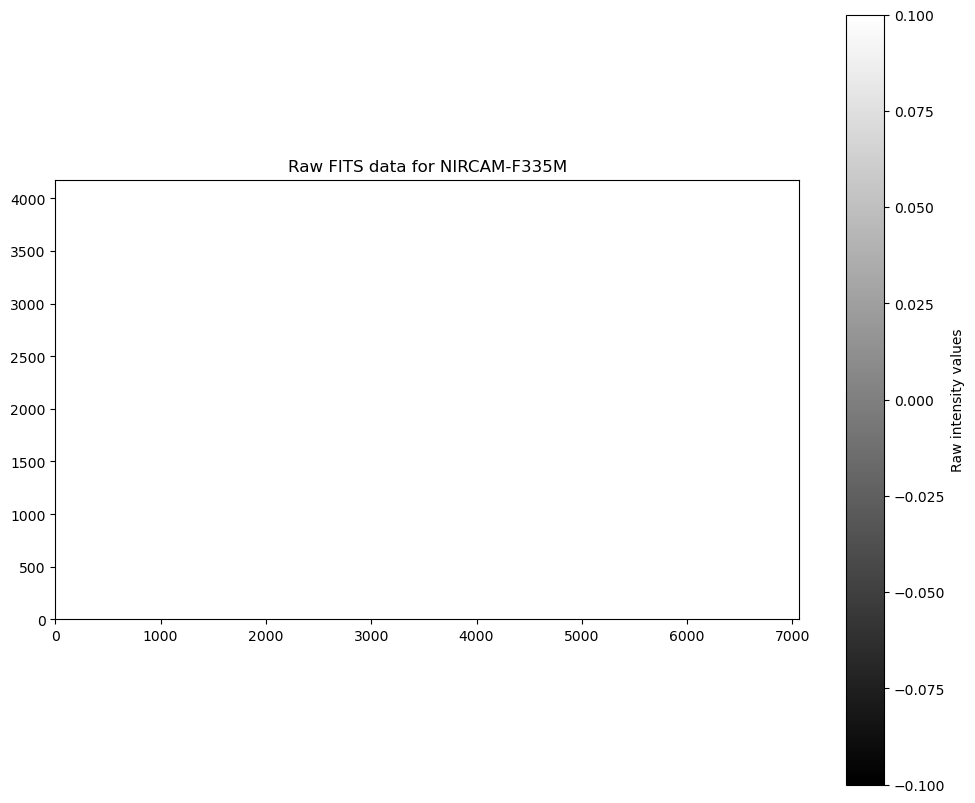

Stretching contrast: clipping values below 1.515616 and above 52.285180
Applying adaptive histogram equalization...


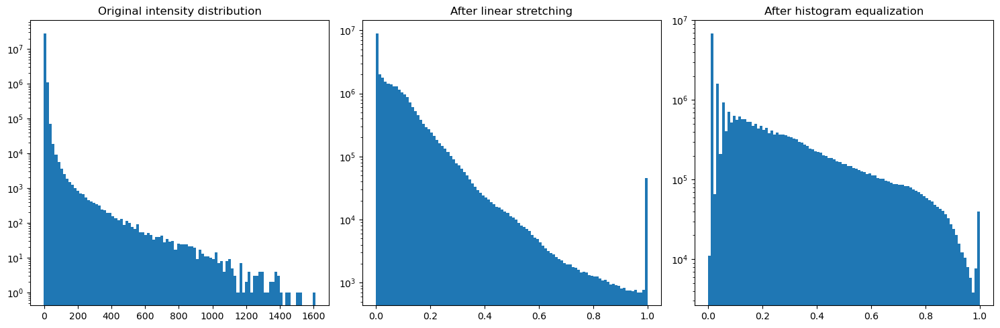

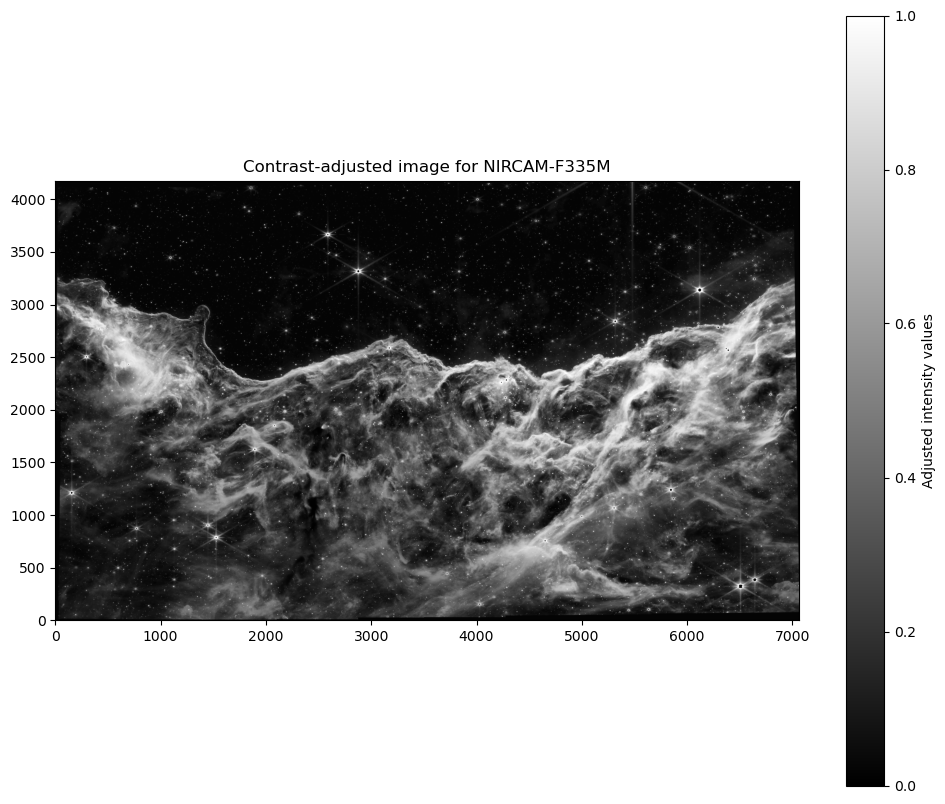

Reprojecting NIRCAM-F335M to match NIRCAM-F200W...
This may take a while for large images...
Processing rows 0 to 3486...
Processing rows 3486 to 6972...
Processing rows 6972 to 8588...
Reprojection of NIRCAM-F335M complete!


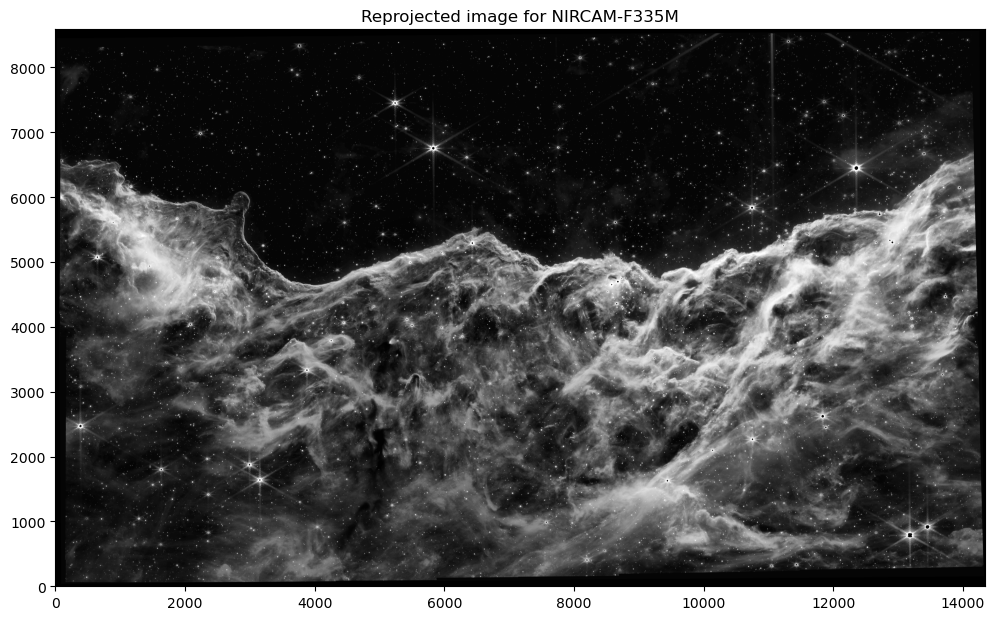

Saving layer image to layers/JW02731_NIRCAM-F335M.png

Processing NIRCAM-F090W...


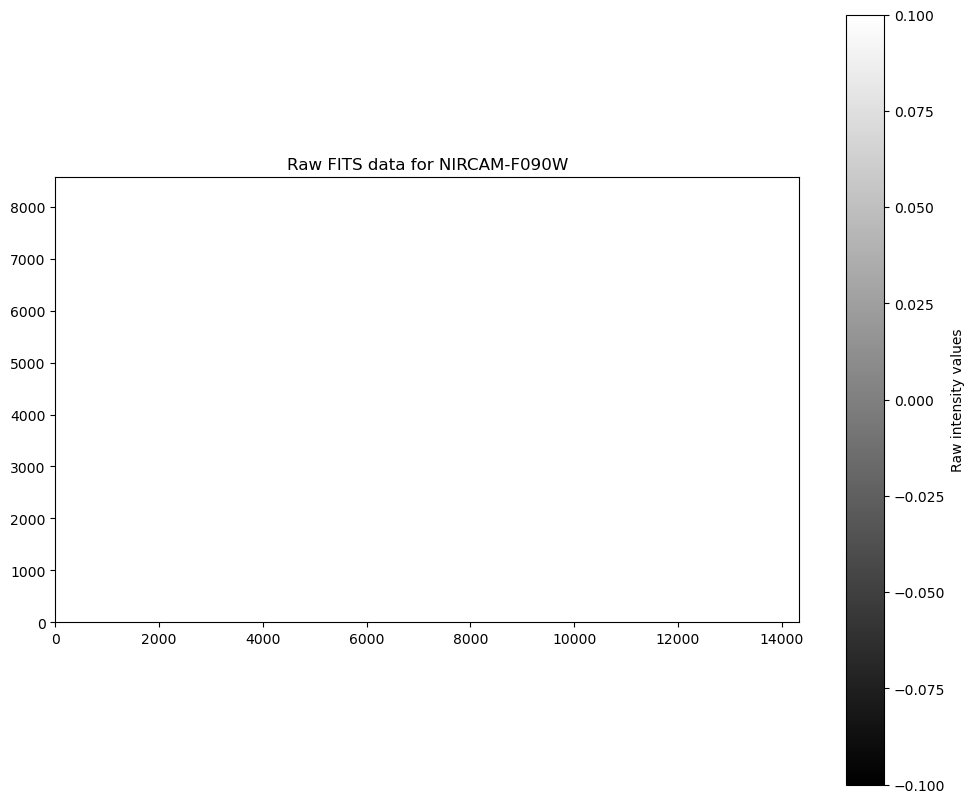

Stretching contrast: clipping values below 0.804514 and above 24.674273
Applying adaptive histogram equalization...


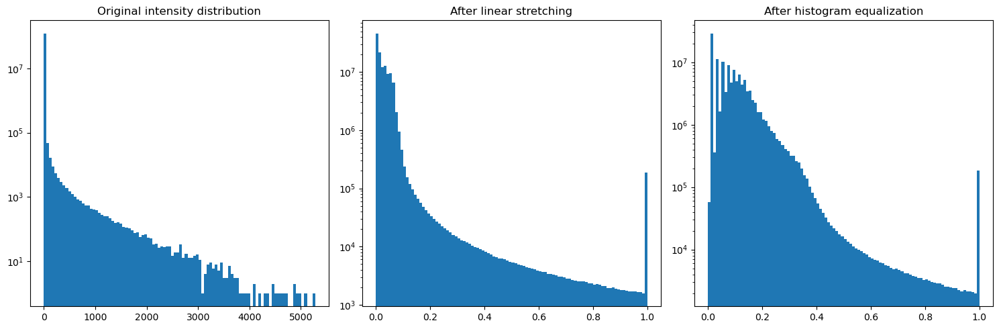

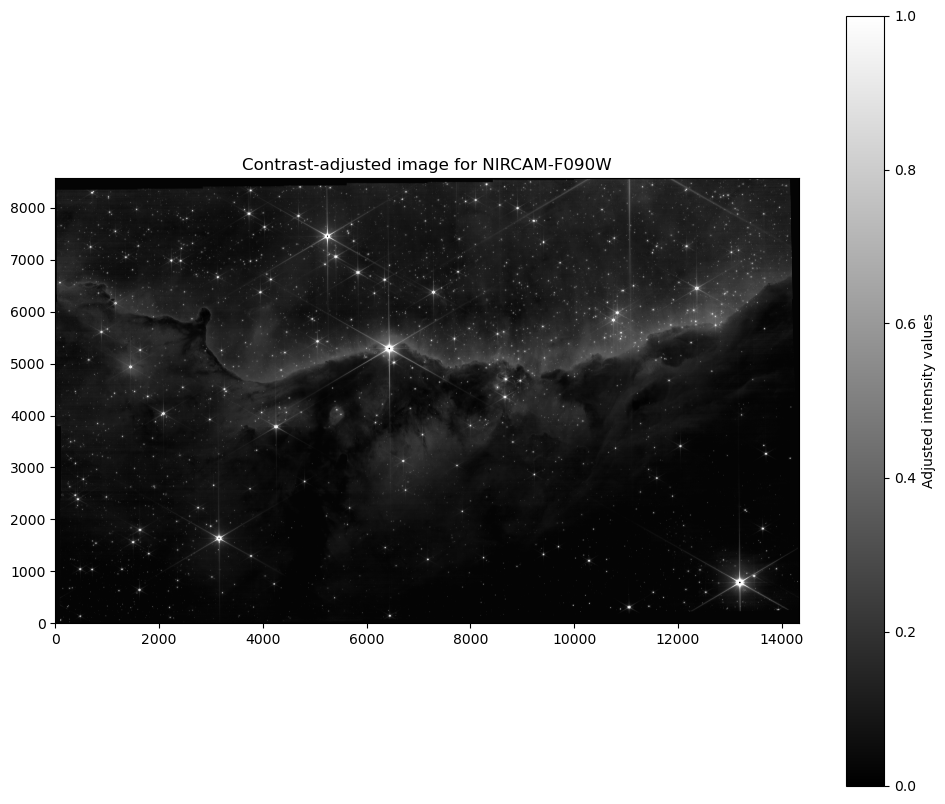

Reprojecting NIRCAM-F090W to match NIRCAM-F200W...
This may take a while for large images...
Processing rows 0 to 3486...
Processing rows 3486 to 6972...
Processing rows 6972 to 8588...
Reprojection of NIRCAM-F090W complete!


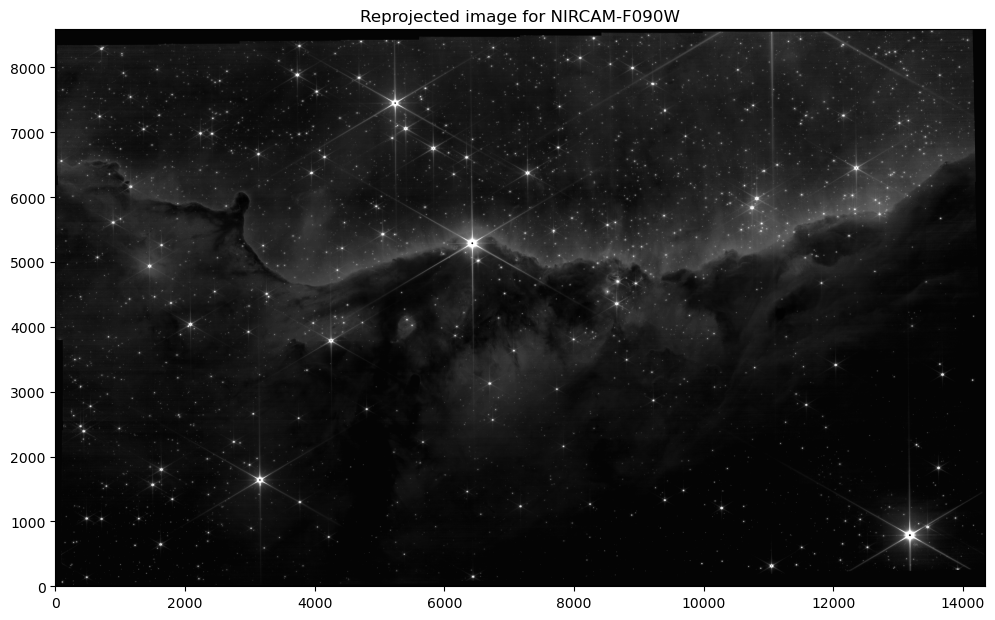

Saving layer image to layers/JW02731_NIRCAM-F090W.png

Processing NIRCAM-F470N...


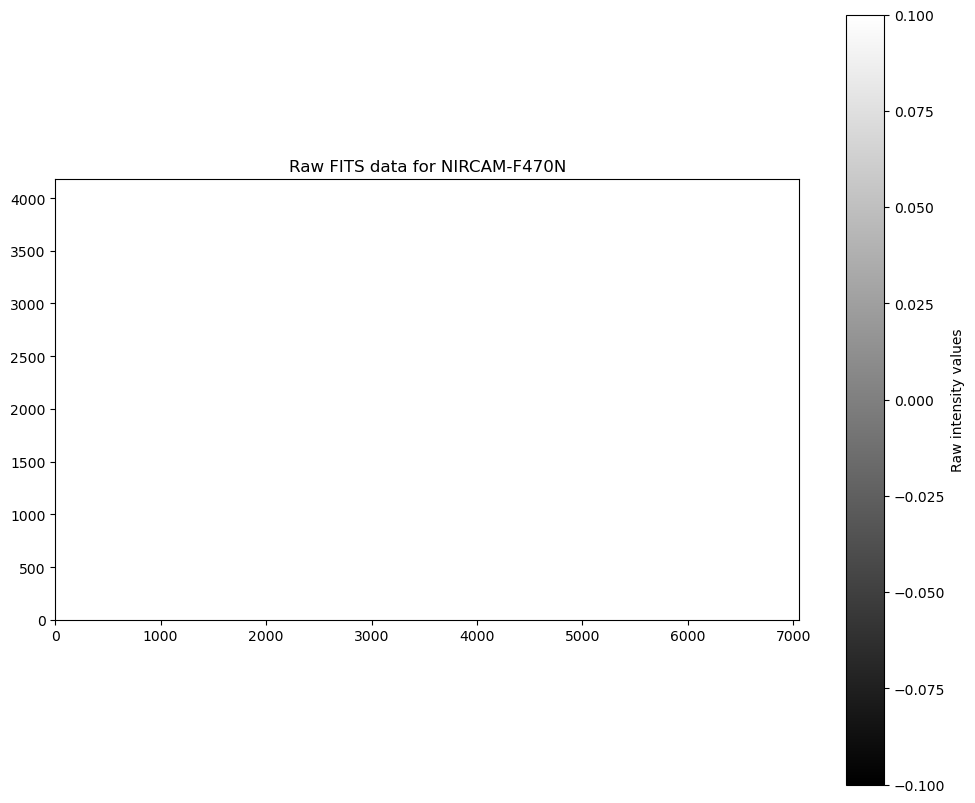

Stretching contrast: clipping values below 1.641506 and above 49.632543
Applying adaptive histogram equalization...


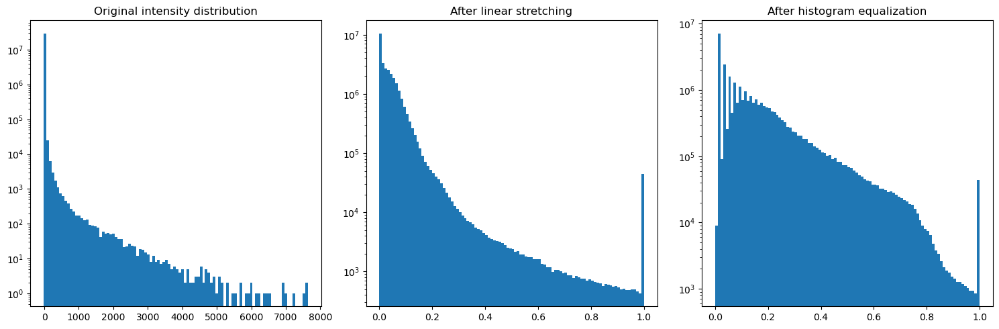

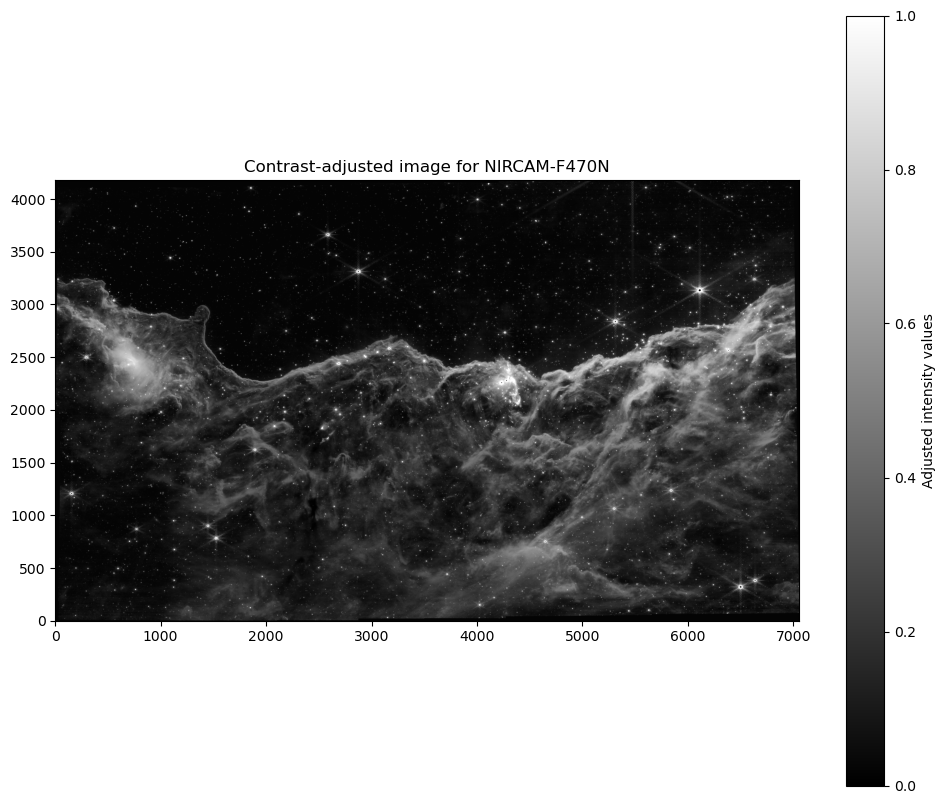

Reprojecting NIRCAM-F470N to match NIRCAM-F200W...
This may take a while for large images...
Processing rows 0 to 3486...
Processing rows 3486 to 6972...
Processing rows 6972 to 8588...
Reprojection of NIRCAM-F470N complete!


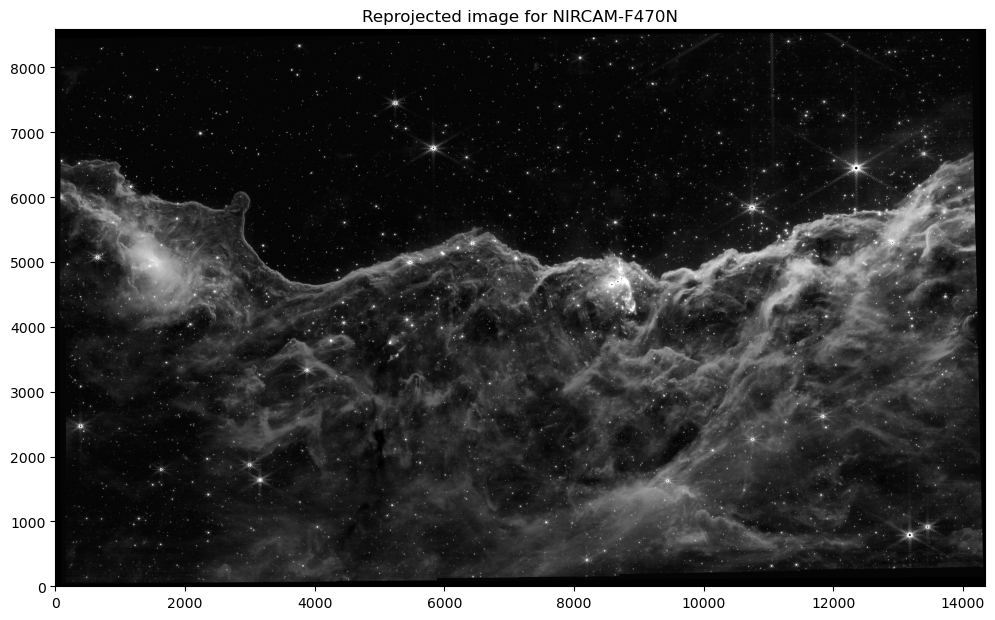

Saving layer image to layers/JW02731_NIRCAM-F470N.png

Creating colorized layer for NIRCAM-F200W...
Created layer: NIRCAM-F200W
HSV values: H=199.3°, S=66.6%, V=100.0%


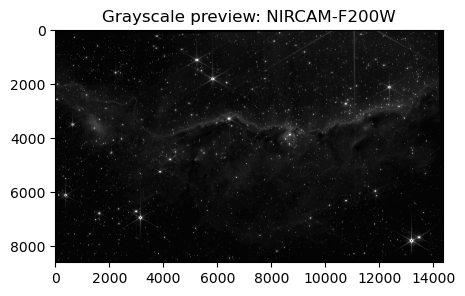

Colorizing NIRCAM-F200W with HSV: (199.3°, 66.6%, 100.0%)


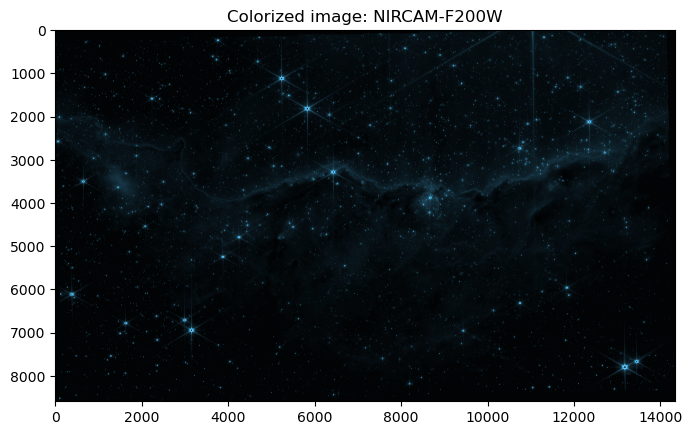


Creating colorized layer for NIRCAM-F187N...
Created layer: NIRCAM-F187N
HSV values: H=207.6°, S=99.7%, V=100.0%


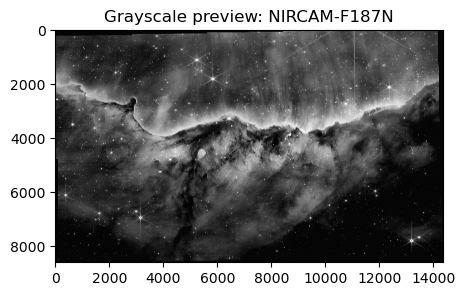

Colorizing NIRCAM-F187N with HSV: (207.6°, 99.7%, 100.0%)


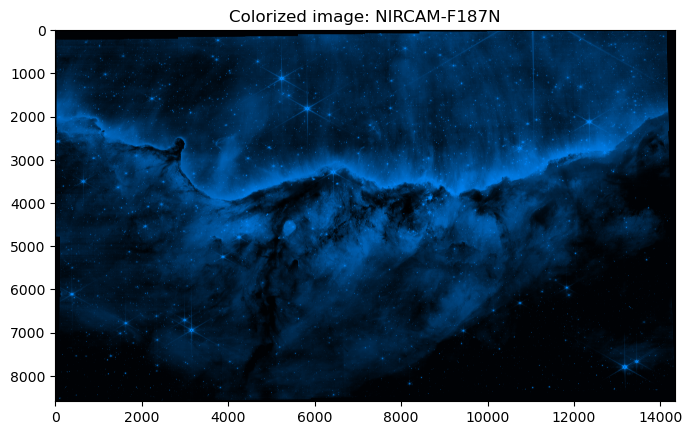


Creating colorized layer for NIRCAM-F335M...
Created layer: NIRCAM-F335M
HSV values: H=56.1°, S=75.2%, V=100.0%


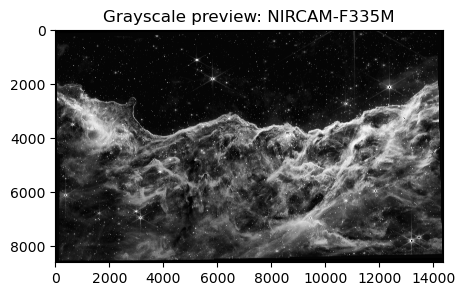

Colorizing NIRCAM-F335M with HSV: (56.1°, 75.2%, 100.0%)


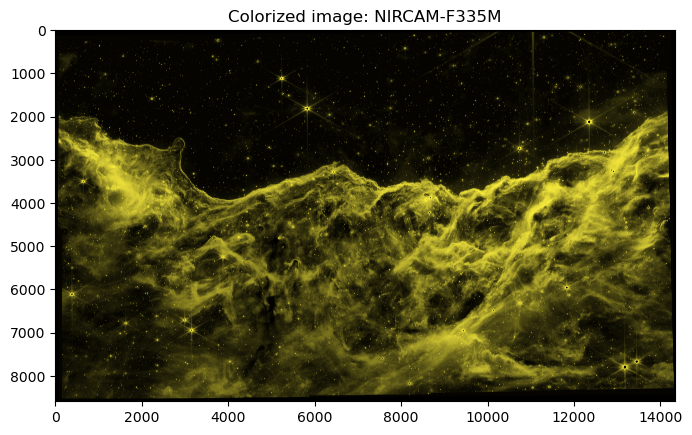


Creating colorized layer for NIRCAM-F090W...
Created layer: NIRCAM-F090W
HSV values: H=239.4°, S=86.8%, V=100.0%


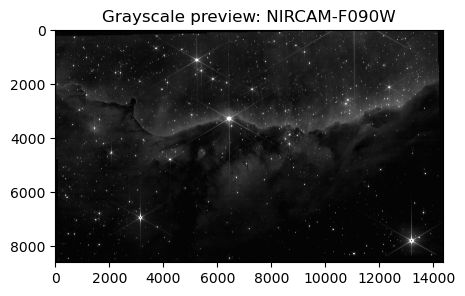

Colorizing NIRCAM-F090W with HSV: (239.4°, 86.8%, 100.0%)


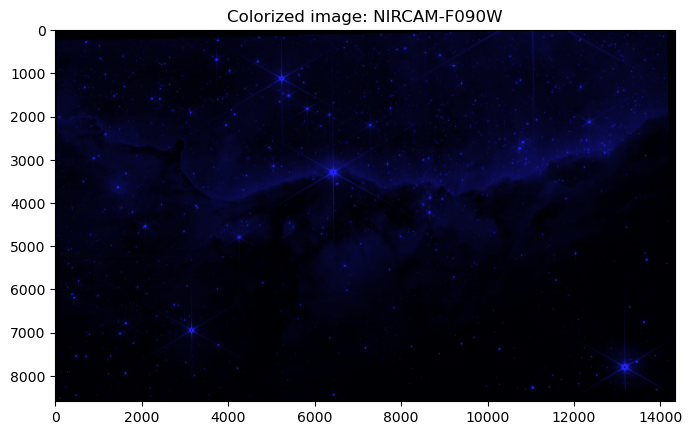


Creating colorized layer for NIRCAM-F470N...
Created layer: NIRCAM-F470N
HSV values: H=0.2°, S=97.6%, V=100.0%


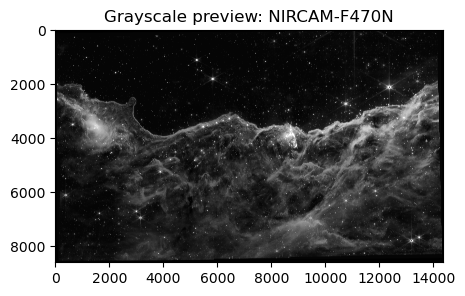

Colorizing NIRCAM-F470N with HSV: (0.2°, 97.6%, 100.0%)


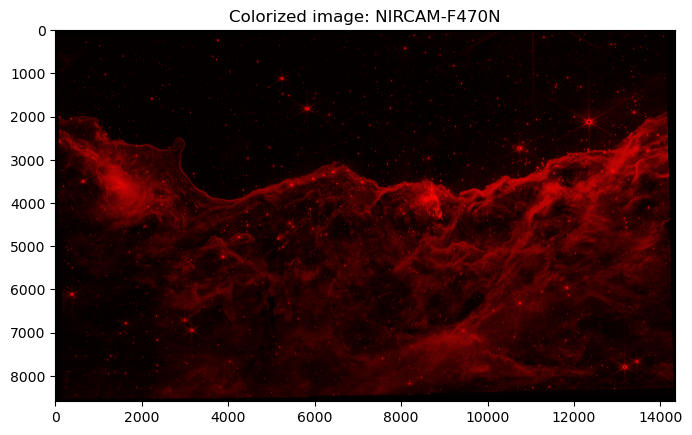


Blending all layers together...
Blending 5 images with brightness factor of 0.75


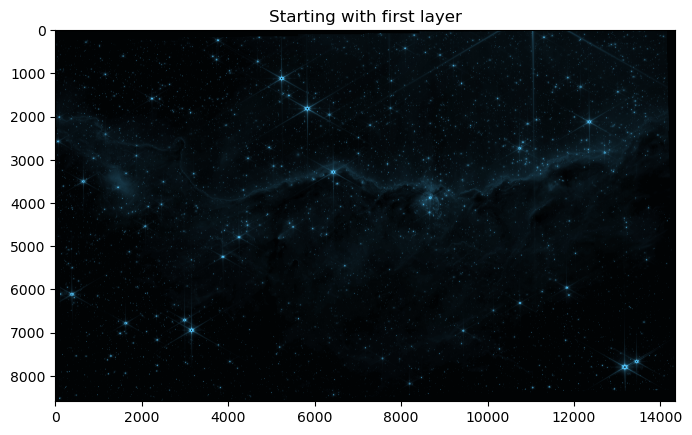

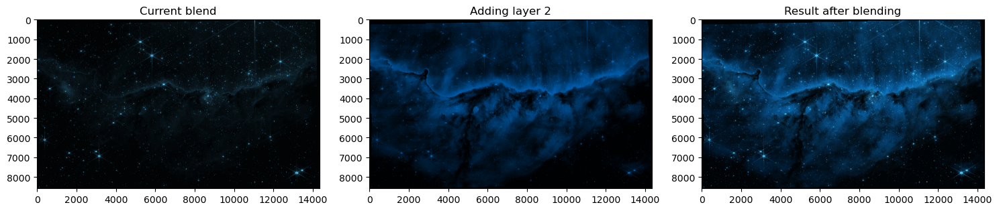

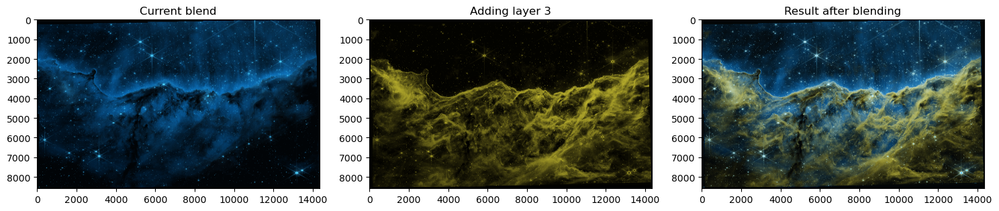

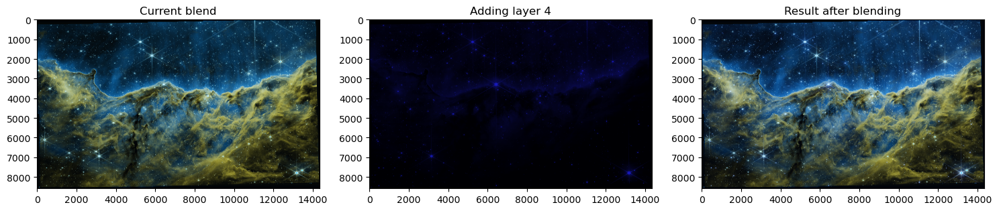

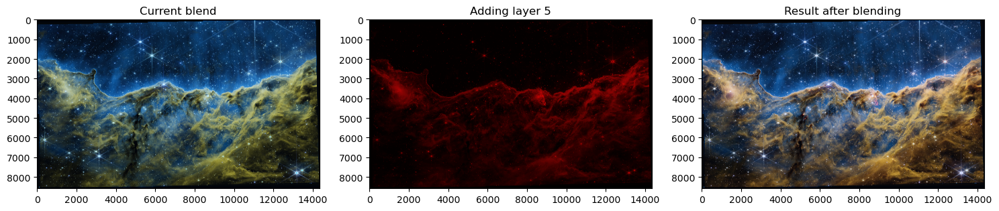

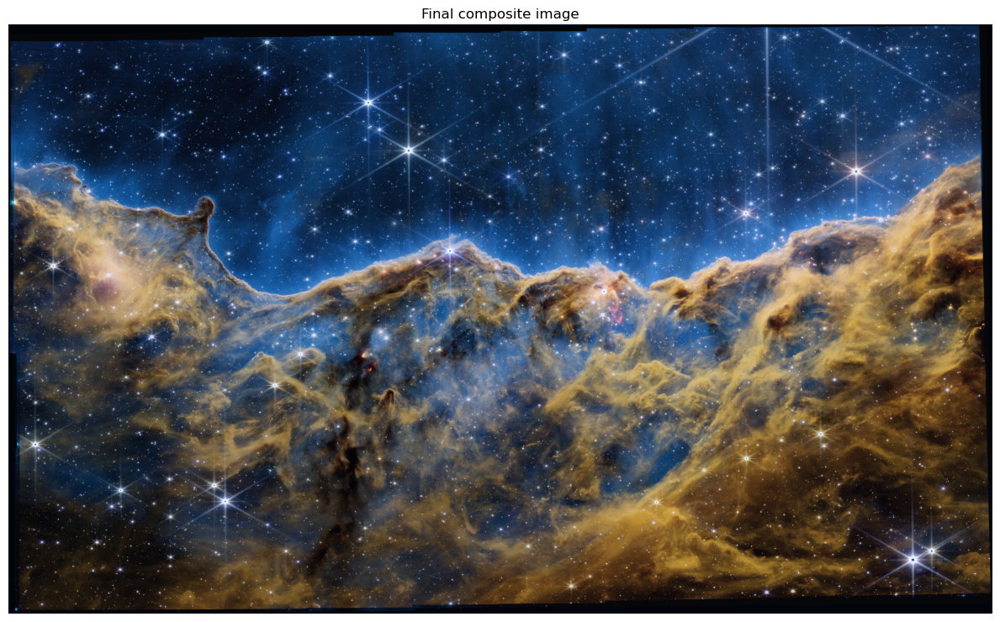


Saved final composite image to output/my_jwst_image.jpg


array([[[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 3, 4],
        [1, 3, 4],
        [1, 3, 4]],

       [[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 4, 7],
        [1, 4, 7],
        [1, 4, 7]],

       [[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 4, 7],
        [1, 4, 7],
        [1, 4, 7]],

       ...,

       [[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 3, 4],
        [1, 3, 4],
        [1, 3, 4]],

       [[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 3, 4],
        [1, 3, 4],
        [1, 3, 4]],

       [[1, 3, 4],
        [1, 3, 4],
        [1, 3, 4],
        ...,
        [1, 3, 4],
        [1, 3, 4],
        [1, 3, 4]]], dtype=uint8)

In [12]:
#Cell 8: Usage Example - Process FITS files
#========================================

# Usage Example - Process FITS files

# Modify the paths below to process your FITS files
fits_folder = "fits"  # Folder containing your FITS files
output_image = "output/my_jwst_image.jpg"  # Where to save the final image
layers_folder = "layers"  # Where to save individual layer images

# Process the FITS files
process_fits_folder(fits_folder, output_image, layers_folder)

In [ ]:
Cell 9: Usage Example - Combine layers with custom colors
======================================================

# Modify the paths below to combine layers with custom colors
layers_folder = "layers"  # Folder containing your layer images
output_image = "output/my_custom_image.jpg"  # Where to save the final image
colors_file = "cosmic_cliffs.txt"  # Optional: file with custom colors
export_colors_file = "output/colors_used.txt"  # Optional: export the colors used

# Combine the layers
combine_layers(layers_folder, output_image, colors_file, export_colors_file)

In [14]:
# Cell 10: Interactive Demo - Adjust Colors for a Layer
# ==================================================

def interactive_color_demo(image_path):
    """
    Demonstrate how different HSV values affect the colorization of a layer.
    """
    from ipywidgets import interact, FloatSlider
    
    # Load the grayscale image
    gray_image = imread(image_path)
    image_name = os.path.basename(image_path)
    
    # Create a function to update the display based on HSV values
    def update_color(hue, saturation, value):
        # Convert HSV to normalized values
        h = hue / 360
        s = saturation / 100
        v = value / 100
        
        # Colorize the image
        rgb = color.gray2rgb(gray_image)
        multiplier = color.hsv2rgb(np.array([h, s, v], dtype=np.float64))
        colored = (rgb * multiplier).astype(np.uint8)
        
        # Display the result
        plt.figure(figsize=(10, 8))
        plt.imshow(colored)
        plt.title(f"Colorized {image_name} with HSV=({hue:.1f}°, {saturation:.1f}%, {value:.1f}%)")
        plt.axis('off')
        plt.show()
        
        # Return string for color specifications
        return f'"{image_path}" ({int(hue)}, {int(saturation)}, {int(value)})'
    
    # Create interactive sliders
    interact(
        update_color,
        hue=FloatSlider(min=0, max=360, step=1, value=180, description='Hue:'),
        saturation=FloatSlider(min=0, max=100, step=1, value=80, description='Saturation:'),
        value=FloatSlider(min=0, max=100, step=1, value=100, description='Value:')
    )

#Example usage:
interactive_color_demo("layers/JW02731_NIRCAM-F090W.png")

interactive(children=(FloatSlider(value=180.0, description='Hue:', max=360.0, step=1.0), FloatSlider(value=80.…

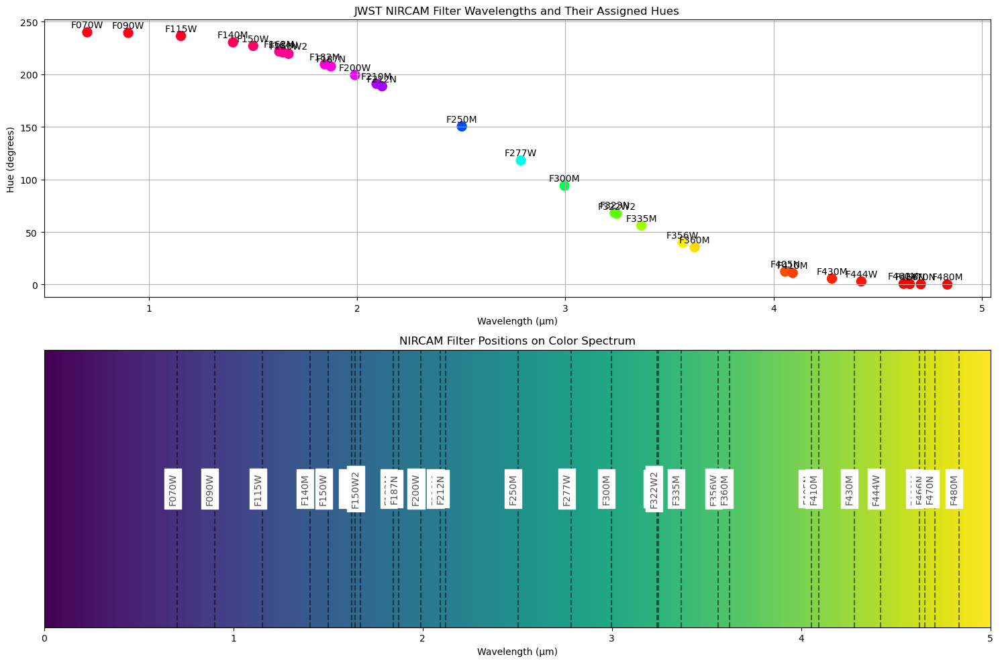

JWST Color Assignment Explanation:
----------------------------------
1. JWST captures images in infrared light, which is invisible to human eyes.
2. To create visible images, we assign colors to different wavelengths.
3. Generally, shorter wavelengths are assigned bluer colors (higher hue values).
4. Longer wavelengths are assigned redder colors (lower hue values).
5. An S-curve adjustment is applied to the mapping to avoid too much green.
6. Filter bandwidth affects saturation - narrower filters get higher saturation.

The plot shows how each NIRCAM filter's wavelength maps to a hue value.


In [15]:
# Cell 12: Understanding the JWST Color Assignment
# =============================================

def visualize_filter_wavelengths():
    """
    Visualize how filter wavelengths correspond to the HSV color space.
    """
    # Collect NIRCAM filter data
    nircam_filters = WebbFilters.FILTERS["NIRCAM"].list
    
    # Sort by wavelength
    nircam_filters.sort(key=lambda x: x.wavelength)
    
    # Calculate HSV values for each filter
    filter_data = []
    for filter in nircam_filters:
        hue, saturation = WebbsterLayer.get_filter_hue_saturation(filter)
        hue_degrees = hue * 360
        filter_data.append({
            'name': filter.name,
            'wavelength': filter.wavelength,
            'bandwidth': filter.bandwidth,
            'hue': hue_degrees,
            'saturation': saturation * 100
        })
    
    # Create a visualization
    plt.figure(figsize=(15, 10))
    
    # Plot wavelength vs hue
    plt.subplot(2, 1, 1)
    wavelengths = [f['wavelength'] for f in filter_data]
    hues = [f['hue'] for f in filter_data]
    names = [f['name'] for f in filter_data]
    
    plt.scatter(wavelengths, hues, c=hues, cmap='hsv', s=100)
    
    # Add filter names as labels
    for i, name in enumerate(names):
        plt.annotate(name, (wavelengths[i], hues[i]), 
                     textcoords="offset points", 
                     xytext=(0, 5), 
                     ha='center')
    
    plt.xlabel('Wavelength (μm)')
    plt.ylabel('Hue (degrees)')
    plt.title('JWST NIRCAM Filter Wavelengths and Their Assigned Hues')
    plt.grid(True)
    
    # Plot the color spectrum with filter positions
    plt.subplot(2, 1, 2)
    
    # Create a horizontal color spectrum
    gradient = np.linspace(0, 1, 1000)
    gradient = np.vstack((gradient, gradient))
    
    # Create colors for each point
    colors = []
    for i in range(len(gradient[0])):
        # Map position to hue (reversed to match the mapping we use)
        hue = 240 * (1 - i/len(gradient[0]))
        colors.append([hue/360, 1, 1])
    
    # Convert HSV to RGB
    colors = color.hsv2rgb(colors)
    
    # Plot the color spectrum
    plt.imshow(gradient, aspect='auto', extent=[0, 5.0, 0, 1], origin='lower')
    
    # Mark filter positions
    for f in filter_data:
        plt.axvline(x=f['wavelength'], color='black', linestyle='--', alpha=0.5)
        plt.text(f['wavelength'], 0.5, f['name'], 
                 rotation=90, va='center', ha='right',
                 backgroundcolor='white', alpha=0.7)
    
    plt.xlabel('Wavelength (μm)')
    plt.title('NIRCAM Filter Positions on Color Spectrum')
    plt.yticks([])
    
    plt.tight_layout()
    plt.show()
    
    # Print explanation
    print("JWST Color Assignment Explanation:")
    print("----------------------------------")
    print("1. JWST captures images in infrared light, which is invisible to human eyes.")
    print("2. To create visible images, we assign colors to different wavelengths.")
    print("3. Generally, shorter wavelengths are assigned bluer colors (higher hue values).")
    print("4. Longer wavelengths are assigned redder colors (lower hue values).")
    print("5. An S-curve adjustment is applied to the mapping to avoid too much green.")
    print("6. Filter bandwidth affects saturation - narrower filters get higher saturation.")
    print("\nThe plot shows how each NIRCAM filter's wavelength maps to a hue value.")

visualize_filter_wavelengths()

Reading FITS file: fits/jw02731-o001_t017_nircam_clear-f090w_i2d.fits

=== FITS File Structure ===
Filename: fits/jw02731-o001_t017_nircam_clear-f090w_i2d.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     365   ()      
  1  SCI           1 ImageHDU        75   (14338, 8581)   float32   
  2  ERR           1 ImageHDU        10   (14338, 8581)   float32   
  3  CON           1 ImageHDU        10   (14338, 8581, 5)   int32   
  4  WHT           1 ImageHDU         9   (14338, 8581)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (14338, 8581)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (14338, 8581)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (14338, 8581)   float32   
  8  HDRTAB        1 BinTableHDU    844   160R x 417C   [23A, 5A, 3A, 45A, 7A, 13A, 7A, 5A, 6A, 7A, 10A, 4A, L, D, D, D, D, 32A, 50A, 32A, 21A, 3A, 3A, D, D, 10A, 12A, 23A, 23A, 26A, 11A, 5A, 3A, 3A, 2A, 1A, 2A, 1A, L, 14A, 23A, 2A, 26A, 20A,

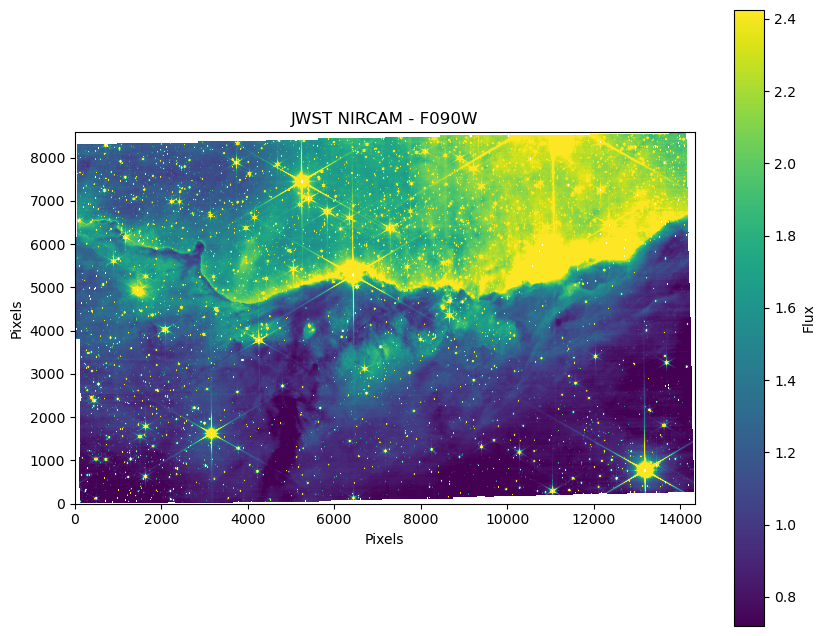

In [2]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import os

def read_jwst_fits(file_path):
    """
    Read a JWST FITS file and display its metadata and basic information.
    
    Parameters
    ----------
    file_path : str
        Path to the FITS file
        
    Returns
    -------
    hdul : astropy.io.fits.HDUList
        FITS HDU list object containing all the data
    """
    # Check if file exists
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")
    
    # Open the FITS file
    print(f"Reading FITS file: {file_path}")
    hdul = fits.open(file_path)
    
    # Print general structure information
    print("\n=== FITS File Structure ===")
    hdul.info()
    
    # Display shape and type for each data extension
    print("\n=== Data Shapes and Types ===")
    for i, hdu in enumerate(hdul):
        if hasattr(hdu, 'data') and hdu.data is not None:
            print(f"HDU {i}: {hdu.name}")
            print(f"  Shape: {hdu.data.shape}")
            print(f"  Data type: {hdu.data.dtype}")
            
            # Basic statistics if it's image data
            if len(hdu.data.shape) >= 2:
                data = hdu.data
                if len(data.shape) > 2:  # For cubes, take the first plane
                    data = data[0]
                print(f"  Min: {np.nanmin(data)}")
                print(f"  Max: {np.nanmax(data)}")
                print(f"  Mean: {np.nanmean(data)}")
                print(f"  Median: {np.nanmedian(data)}")
    
    # Display primary header information
    print("\n=== Primary Header Information ===")
    header = hdul[0].header
    
    # Display some common JWST keywords if they exist
    important_keywords = [
        'TELESCOP', 'INSTRUME', 'FILTER', 'PUPIL', 'DETECTOR', 
        'DATE-OBS', 'TIME-OBS', 'EXPTIME', 'TSOVISIT',
        'TARGNAME', 'BUNIT', 'RADESYS', 'RA_TARG', 'DEC_TARG'
    ]
    
    print("\n=== Key JWST Information ===")
    for keyword in important_keywords:
        if keyword in header:
            print(f"{keyword:12s} = {header[keyword]}")
    
    # Display a preview of the full header
    print("\n=== First 20 Header Keywords ===")
    for i, (key, value) in enumerate(header.items()):
        if i >= 20:
            print("...")
            break
        print(f"{key:8s} = {value}")
    
    # Show a sample image if it's an image file
    if len(hdul) > 1 and hasattr(hdul[1], 'data') and hdul[1].data is not None:
        primary_data = hdul[1].data  # Often science data is in the first extension
        
        if len(primary_data.shape) >= 2:
            plt.figure(figsize=(10, 8))
            
            # For data cubes, take the first plane
            if len(primary_data.shape) > 2:
                display_data = primary_data[0]
            else:
                display_data = primary_data
                
            # Use robust statistical clipping for display
            vmin = np.nanpercentile(display_data, 5)
            vmax = np.nanpercentile(display_data, 95)
            
            plt.imshow(display_data, origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
            plt.colorbar(label='Flux')
            plt.title(f"JWST {header.get('INSTRUME', 'Instrument')} - {header.get('FILTER', 'Filter')}")
            plt.xlabel('Pixels')
            plt.ylabel('Pixels')
            plt.show()
    
    return hdul

# Example usage
if __name__ == "__main__":
    file_path = "fits/jw02731-o001_t017_nircam_clear-f090w_i2d.fits"
    hdul = read_jwst_fits(file_path)
    
    # Always close the file when done
    hdul.close()

Image Statistics for ./fits/jw02731-o001_t017_nircam_clear-f090w_i2d.fits
Shape: (8581, 14338)
Data type: >f4
Dynamic Range:
  Min: -3.290020227432251
  Max: 5277.29052734375
  Dynamic range ratio: Infinity
  Mean: 1.6536626815795898
  Median: 1.2273764610290527
Percentiles:
  1%: 0.6175467371940613
  15%: 0.8389768600463867
  50%: 1.2273764610290527
  99%: 3.837014765739447
  99.85%: 25.765811135291415
Ratio 99.85% to 15%: 30.710991401916417


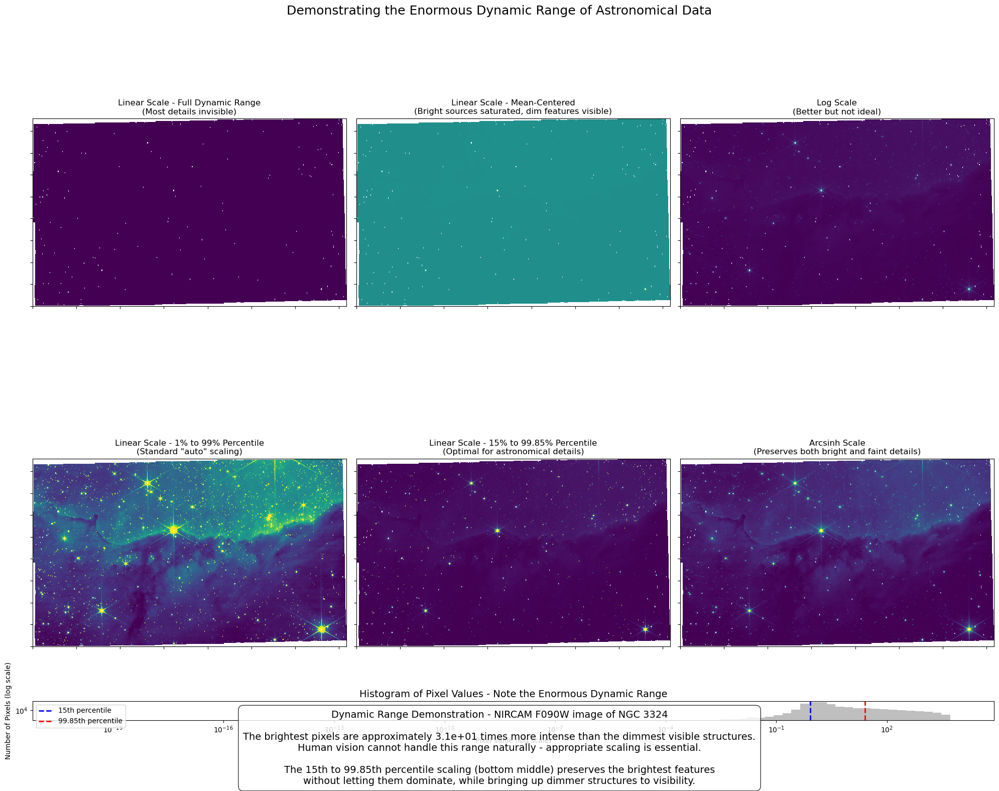

In [5]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

def demonstrate_dynamic_range(fits_file, extension=1):
    """
    Demonstrate the importance of proper scaling for astronomical images
    by showing the same image with different scaling methods.
    
    Parameters
    ----------
    fits_file : str
        Path to the FITS file
    extension : int, optional
        Extension containing the science data (default: 1)
    """
    # Open the FITS file and get the science data
    with fits.open(fits_file) as hdul:
        data = hdul[extension].data
        
        # Extract basic header information
        header = hdul[extension].header
        try:
            filter_name = hdul[0].header.get('FILTER', 'Unknown Filter')
            instrument = hdul[0].header.get('INSTRUME', 'JWST')
            target = hdul[0].header.get('TARGNAME', 'Unknown Target')
        except:
            filter_name = 'Unknown Filter'
            instrument = 'JWST'
            target = 'Unknown Target'
    
    # Calculate statistics
    min_val = np.nanmin(data)
    max_val = np.nanmax(data)
    mean_val = np.nanmean(data)
    median_val = np.nanmedian(data)
    
    # Calculate percentiles for comparison
    p1 = np.nanpercentile(data, 1)
    p15 = np.nanpercentile(data, 15)
    p50 = np.nanpercentile(data, 50)
    p99 = np.nanpercentile(data, 99)
    p99_85 = np.nanpercentile(data, 99.85)

    # Print statistics for reference
    print(f"Image Statistics for {fits_file}")
    print(f"Shape: {data.shape}")
    print(f"Data type: {data.dtype}")
    print(f"Dynamic Range:")
    print(f"  Min: {min_val}")
    print(f"  Max: {max_val}")
    print(f"  Dynamic range ratio: {max_val/min_val if min_val > 0 else 'Infinity'}")
    print(f"  Mean: {mean_val}")
    print(f"  Median: {median_val}")
    print(f"Percentiles:")
    print(f"  1%: {p1}")
    print(f"  15%: {p15}")
    print(f"  50%: {p50}")
    print(f"  99%: {p99}")
    print(f"  99.85%: {p99_85}")
    print(f"Ratio 99.85% to 15%: {p99_85/p15}")

    # Create a figure with multiple panels to demonstrate different scaling
    plt.figure(figsize=(20, 16))
    gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 0.05])
    
    # First, show the full dynamic range with linear scaling
    ax1 = plt.subplot(gs[0, 0])
    im1 = ax1.imshow(data, origin='lower', cmap='viridis', 
                    norm=Normalize(vmin=min_val, vmax=max_val))
    ax1.set_title('Linear Scale - Full Dynamic Range\n(Most details invisible)', fontsize=12)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    
    # Show linear scaling with mean-centered range
    ax2 = plt.subplot(gs[0, 1])
    center_range = max(abs(max_val - mean_val), abs(mean_val - min_val))
    im2 = ax2.imshow(data, origin='lower', cmap='viridis',
                    norm=Normalize(vmin=mean_val-center_range/10, vmax=mean_val+center_range/10))
    ax2.set_title('Linear Scale - Mean-Centered\n(Bright sources saturated, dim features visible)', fontsize=12)
    ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    
    # Show log scaling
    ax3 = plt.subplot(gs[0, 2])
    # Handle negative values for log scale by offsetting
    offset = abs(min_val) + 1 if min_val <= 0 else 0
    im3 = ax3.imshow(data + offset, origin='lower', cmap='viridis',
                    norm=LogNorm(vmin=max(p1 + offset, 1e-10), vmax=max_val + offset))
    ax3.set_title('Log Scale\n(Better but not ideal)', fontsize=12)
    ax3.set_xticklabels([])
    ax3.set_yticklabels([])
    
    # Show 1% to 99% percentile linear scaling (typical "auto" scaling)
    ax4 = plt.subplot(gs[1, 0])
    im4 = ax4.imshow(data, origin='lower', cmap='viridis',
                    norm=Normalize(vmin=p1, vmax=p99))
    ax4.set_title('Linear Scale - 1% to 99% Percentile\n(Standard "auto" scaling)', fontsize=12)
    ax4.set_xticklabels([])
    ax4.set_yticklabels([])
    
    # Show "optimal" 15th to 99.85th percentile scaling
    ax5 = plt.subplot(gs[1, 1])
    im5 = ax5.imshow(data, origin='lower', cmap='viridis',
                    norm=Normalize(vmin=p15, vmax=p99_85))
    ax5.set_title('Linear Scale - 15% to 99.85% Percentile\n(Optimal for astronomical details)', fontsize=12)
    ax5.set_xticklabels([])
    ax5.set_yticklabels([])
    
    # Show asinh (arcsinh) scaling - good for astronomical images
    ax6 = plt.subplot(gs[1, 2])
    # Normalize data to 0-1 range
    norm_data = (data - p15) / (p99_85 - p15)
    norm_data = np.clip(norm_data, 0, 1)  # Clip to 0-1 range
    # Apply asinh transformation
    beta = 0.1  # Controls how linear/logarithmic the stretch is
    asinh_data = np.arcsinh(norm_data/beta)/np.arcsinh(1/beta)
    im6 = ax6.imshow(asinh_data, origin='lower', cmap='viridis')
    ax6.set_title('Arcsinh Scale\n(Preserves both bright and faint details)', fontsize=12)
    ax6.set_xticklabels([])
    ax6.set_yticklabels([])
    
    # Add a histogram of pixel values
    ax_hist = plt.subplot(gs[2, :])
    
    # Create a histogram with logarithmic bins and logarithmic counts
    # to better show the dynamic range
    log_bins = np.logspace(np.log10(max(min_val, 1e-20)), np.log10(max_val), 100)
    hist, bins = np.histogram(data.flatten(), bins=log_bins)
    
    width = (bins[1:] - bins[:-1])
    center = (bins[:-1] + bins[1:]) / 2
    
    # Highlight the percentile regions
    ax_hist.bar(center, hist, width=width, alpha=0.5, color='gray', align='center')
    
    # Mark key percentiles
    if p15 > 0:
        ax_hist.axvline(x=p15, color='blue', linestyle='--', linewidth=2, 
                        label='15th percentile')
    if p99_85 > 0:
        ax_hist.axvline(x=p99_85, color='red', linestyle='--', linewidth=2, 
                        label='99.85th percentile')
    
    ax_hist.set_xscale('log')
    ax_hist.set_yscale('log')
    ax_hist.set_xlabel('Pixel Value (log scale)')
    ax_hist.set_ylabel('Number of Pixels (log scale)')
    ax_hist.set_title('Histogram of Pixel Values - Note the Enormous Dynamic Range', fontsize=14)
    ax_hist.legend()
    
    # Add text annotation explaining the dynamic range
    dynamic_range_text = (
        f"Dynamic Range Demonstration - {instrument} {filter_name} image of {target}\n\n"
        f"The brightest pixels are approximately {p99_85/p15:.1e} times more intense than the dimmest visible structures.\n"
        f"Human vision cannot handle this range naturally - appropriate scaling is essential.\n\n"
        f"The 15th to 99.85th percentile scaling (bottom middle) preserves the brightest features\n"
        f"without letting them dominate, while bringing up dimmer structures to visibility."
    )
    
    plt.figtext(0.5, 0.01, dynamic_range_text, ha='center', fontsize=14, 
                bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))
    
    plt.tight_layout(rect=[0, 0.05, 1, 0.97])
    plt.suptitle(f'Demonstrating the Enormous Dynamic Range of Astronomical Data', fontsize=18)
    
    return plt.gcf()

# Example usage
if __name__ == "__main__":
    fits_file = "./fits/jw02731-o001_t017_nircam_clear-f090w_i2d.fits"
    fig = demonstrate_dynamic_range(fits_file)
    plt.savefig('jwst_dynamic_range_demo.png', dpi=300, bbox_inches='tight')
    plt.show()